In [1]:
import pandas as pd
from lifelines import CoxPHFitter
from lifelines.datasets import load_rossi
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
from lifelines import WeibullFitter

/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt 

In [5]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [6]:
lax_caus = pd.read_csv(r'/Users/hernanadasme/Projects/bom/2023-02-22-BodleianV1-weeklybills-parishes.csv', sep=',')

In [7]:
lax_caus

,Omeka Item #,DataScribe Item #,DataScribe Record #,DataScribe Record Position,Year,is_missing,is_illegible,Week,is_missing.1,is_illegible.1,Unique ID,is_missing.2,is_illegible.2,Start Day,is_missing.3,is_illegible.3,Start Month,is_missing.4,is_illegible.4,End Day,is_missing.5,is_illegible.5,End month,is_missing.6,is_illegible.6,St Alban Woodstreet - Buried,is_missing.7,is_illegible.7,St Alban Woodstreet - Plague,is_missing.8,is_illegible.8,Alhallows Barking - Buried,is_missing.9,is_illegible.9,Alhallows Barking - Plague,is_missing.10,is_illegible.10,Alhallows Breadstreet - Buried,is_missing.11,is_illegible.11,Alhallows Breadstreet - Plague,is_missing.12,is_illegible.12,Alhallows Great - Buried,is_missing.13,is_illegible.13,Alhallows Great - Plague,is_missing.14,is_illegible.14,Alhallows Honylane - Buried,is_missing.15,is_illegible.15,Alhallows Honylane - Plague,is_missing.16,is_illegible.16,Alhallows Lesse - Buried,is_missing.17,is_illegible.17,Alhallows Lesse - Plague,is_missing.18,is_illegible.18,Alhallows Lumbardstreet - Buried,is_missing.19,is_illegible.19,Alhallows Lumbardstreet - Plague,is_missing.20,is_illegible.20,Alhallows Stayning - Buried,is_missing.21,is_illegible.21,Alhallows Stayning - Plague,is_missing.22,is_illegible.22,Alhallows the Wall - Buried,is_missing.23,is_illegible.23,Alhallows the Wall - Plague,is_missing.24,is_illegible.24,St Alphage - Buried,is_missing.25,is_illegible.25,St Alphage - Plague,is_missing.26,is_illegible.26,St Andrew Hubbard - Buried,is_missing.27,is_illegible.27,St Andrew Hubbard - Plague,is_missing.28,is_illegible.28,St Andrew Undershaft - Buried,is_missing.29,is_illegible.29,St Andrew Undershaft - Plague,is_missing.30,is_illegible.30,St Andrew Wardrobe - Buried,is_missing.31,is_illegible.31,St Andrew Wardrobe - Plague,is_missing.32,is_illegible.32,St Ann Aldersgate - Buried,is_missing.33,is_illegible.33,St Ann Aldersgate - Plague,is_missing.34,is_illegible.34,St Ann Blackfryers - Buried,is_missing.35,is_illegible.35,St Ann Blackfryers - Plague,is_missing.36,is_illegible.36,St Antholins Parish - Buried,is_missing.37,is_illegible.37,St Antholins Parish - Plague,is_missing.38,is_illegible.38,St Austins Parish - Buried,is_missing.39,is_illegible.39,St Austins Parish - Plague,is_missing.40,is_illegible.40,St Bartholomew Exchange - Buried,is_missing.41,is_illegible.41,St Bartholomew Exchange - Plague,is_missing.42,is_illegible.42,St Bennet Fynck - Buried,is_missing.43,is_illegible.43,St Bennet Fynck - Plague,is_missing.44,is_illegible.44,St Bennet Gracechurch - Buried,is_missing.45,is_illegible.45,St Bennet Gracechurch - Plague,is_missing.46,is_illegible.46,St Bennet Paulswharf - Buried,is_missing.47,is_illegible.47,St Bennet Paulswharf - Plague,is_missing.48,is_illegible.48,St Bennet Sherehog - Buried,is_missing.49,is_illegible.49,St Bennet Sherehog - Plague,is_missing.50,is_illegible.50,St Botolph Billingsgate - Buried,is_missing.51,is_illegible.51,St Botolph Billingsgate - Plague,is_missing.52,is_illegible.52,Christ Church - Buried,is_missing.53,is_illegible.53,Christ Church - Plague,is_missing.54,is_illegible.54,St Christophers - Buried,is_missing.55,is_illegible.55,St Christophers - Plague,is_missing.56,is_illegible.56,St Clement Eastcheap - Buried,is_missing.57,is_illegible.57,St Clement Eastcheap - Plague,is_missing.58,is_illegible.58,St Dionis Backchurch - Buried,is_missing.59,is_illegible.59,St Dionis Backchurch - Plague,is_missing.60,is_illegible.60,St Dunstan East - Buried,is_missing.61,is_illegible.61,St Dunstan East - Plague,is_missing.62,is_illegible.62,St Edmund Lumbardstr. - Buried,is_missing.63,is_illegible.63,St Edmund Lumbardstr. - Plague,is_missing.64,is_illegible.64,St Ethelborough - Buried,is_missing.65,is_illegible.65,St Ethelborough - Plague,is_missing.66,is_illegible.66,St Faith - Buried,is_missing.67,is_illegible.67,St Faith - Plague,is_missing.68,is_illegible.68,St Foster - Buried,is_missing.69,is_illegible.69,St Foster - Plague,is_missing.70,is_illegible.70,St 

In [5]:
lax_caus.Year.value_counts()

1642    48
1647    48
1646    46
1639    37
1644    35
1638    33
1636    20
1641    19
1649    12
1640     2
1643     1
Name: Year, dtype: int64

In [6]:
out_1636 = pd.read_csv(r'/Users/hernanadasme/Projects/bom/datasets_survival/df_1636_id_03_11_2023.csv', sep=',')

In [7]:
out_1636 = out_1636.drop(['Unnamed: 0' ], axis=1)

In [8]:
# Convert the duration column to integer data type
out_1636['duration'] = out_1636['duration'].astype(int)

In [9]:
out_1636.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 26 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        124 non-null    int64 
 1   parish    124 non-null    object
 2   20        124 non-null    int64 
 3   21        124 non-null    int64 
 4   22        124 non-null    int64 
 5   23        124 non-null    int64 
 6   24        124 non-null    int64 
 7   27        124 non-null    int64 
 8   29        124 non-null    int64 
 9   30        124 non-null    int64 
 10  33        124 non-null    int64 
 11  34        124 non-null    int64 
 12  35        124 non-null    int64 
 13  37        124 non-null    int64 
 14  38        124 non-null    int64 
 15  39        124 non-null    int64 
 16  40        124 non-null    int64 
 17  41        124 non-null    int64 
 18  42        124 non-null    int64 
 19  43        124 non-null    int64 
 20  44        124 non-null    int64 
 21  45        124 no

In [10]:
out_1636

,id,parish,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event,Category
0,1,St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1,Group A
1,2,Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1,Group A
2,3,Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1,Group A
3,4,Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1,Group A
4,5,Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
5,6,Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1,Group A
6,7,Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
7,8,Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,Group A
8,9,Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1,Group A
9,10,St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1,Group A


In [11]:
out_1636_copy = out_1636.copy()

In [12]:
# Create a mapping dictionary
mapping = {'Group A': 1, 'Group B': 2, 'Group C': 3}

# Replace values in the 'group' column
out_1636_copy['Category'] = out_1636_copy['Category'].replace(mapping)

In [13]:
out_1636_copy

,id,parish,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event,Category
0,1,St Alban Woodstreet - Plague,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1,1
1,2,Alhallows Barking - Plague,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1,1
2,3,Alhallows Breadstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1,1
3,4,Alhallows Great - Plague,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1,1
4,5,Alhallows Honylane - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,1
5,6,Alhallows Lesse - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1,1
6,7,Alhallows Lumbardstreet - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,1
7,8,Alhallows Stayning - Plague,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,1
8,9,Alhallows the Wall - Plague,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1,1
9,10,St Alphage - Plague,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1,1


In [14]:
kmf = KaplanMeierFitter()
kmf.fit(out_1636['duration'], event_observed= out_1636['event'])

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 124 total observations, 20 right-censored observations>

<AxesSubplot: xlabel='timeline'>

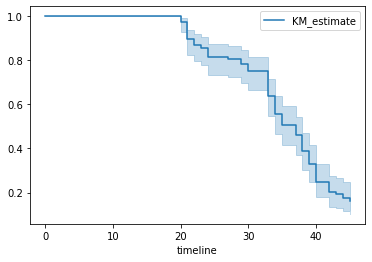

In [15]:
kmf.plot_survival_function()

   test_statistic             p    -log2(p)
0      290.580685  3.715615e-65  214.031725


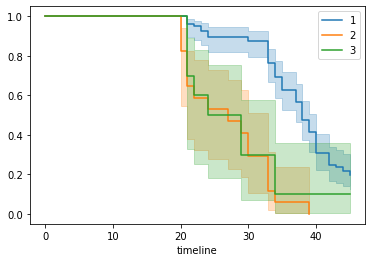

In [55]:
# Fit Kaplan-Meier survival curves for each group
kmf_2 = KaplanMeierFitter()

groups = out_1636_copy['Category'].unique()
for group in groups:
    group_data = out_1636_copy[out_1636_copy['Category'] == group]
    kmf_2.fit(group_data['duration'], group_data['event'], label = group)
    kmf_2.plot()

# Perform LogRank test
results = logrank_test(
    out_1636_copy['duration'],  # Duration column
    out_1636_copy['Category'],     # Group column
    out_1636_copy['event']      # Event column
)

#Print LogRank test results
print(results.summary)

In [16]:
# Remove " - Plague" from 'name' column
out_1636_copy['parish'] = out_1636_copy['parish'].str.replace(' - Plague', '')

In [18]:
out_1636_copy = out_1636_copy.rename(columns={'parish': 'OMEKA_PAR'})

In [19]:
out_1636_copy

,id,OMEKA_PAR,20,21,22,23,24,27,29,30,33,34,35,37,38,39,40,41,42,43,44,45,sum,duration,event,Category
0,1,St Alban Woodstreet,0,0,0,0,0,0,0,0,0,2,1,1,0,4,0,1,0,1,0,0,10,34,1,1
1,2,Alhallows Barking,0,0,0,0,0,0,0,0,0,3,0,1,1,1,1,2,4,1,3,2,19,34,1,1
2,3,Alhallows Breadstreet,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,2,40,1,1
3,4,Alhallows Great,0,0,1,0,0,0,0,0,0,0,1,1,0,7,2,7,4,5,4,2,34,22,1,1
4,5,Alhallows Honylane,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,1
5,6,Alhallows Lesse,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,0,3,42,1,1
6,7,Alhallows Lumbardstreet,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,1
7,8,Alhallows Stayning,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,45,0,1
8,9,Alhallows the Wall,0,0,0,2,0,0,0,0,0,0,1,6,5,3,3,6,1,2,1,1,31,23,1,1
9,10,St Alphage,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,2,0,1,0,1,9,38,1,1


In [20]:
# save the data frame to a CSV file
out_1636_copy.to_csv('df_1636_06_06_2023.csv', index=True)